# [chat con la tIA](https://chatgpt.com/share/68170fea-92ac-8012-8cfa-74358f5b4121)

# About Dataset
**Bank of America (BAC) Stock Data: 1978-2025**


## Overview:

This dataset provides a comprehensive historical record of Bank of America's (BAC) stock performance from March 1, 1978, to April 6, 2025. Encompassing nearly five decades of financial data, it offers detailed insights into the bank's stock dynamics, capturing significant market events, economic shifts, and company-specific milestones.

## Data Description:

The dataset includes the following columns:

1. ***date:*** The date of the trading day.
2. ***open:*** The opening price of BAC stock for that day. Due to limitations of the historical data source, this field may contain inaccurate zero values in the earlier part of the time series.
3. ***high:*** The highest price of BAC stock during that day.
4. ***low:*** The lowest price of BAC stock during that day.
5. ***close:*** The closing price of BAC stock for that day.
6. ***adj_close:*** The adjusted closing price, which accounts for dividends and stock splits to provide a more accurate reflection of the stock's value over time.
7. ***volume:*** The number of shares traded during the day, indicating market activity and investor interest.

## Usage Notes:

**Data Anomalies:**

The open column contains zero values, particularly in the earlier years. These anomalies should be considered and handled appropriately in any analysis.
Analysts should be aware of potential inaccuracies from the source provider to better understand potential source-related issues.
Time Zone Awareness: The 'date' column includes time zone information. Ensure consistent handling of time zones in your analysis.

## Potential Uses:

This dataset enables a wide range of analyses and applications:

* ***Long-Term Trend Analysis:*** Identify long-term trends in BAC's stock price and trading volume.
* ***Volatility Modeling:*** Study the stock's volatility and risk factors over different periods.
* ***Event Impact Assessment:*** Analyze the impact of specific events (e.g., financial crises, mergers, regulatory changes) on BAC's stock performance.
* ***Algorithmic Trading:*** Develop and backtest trading strategies using historical price movements and volume data.
* ***Financial Forecasting:*** Build predictive models for BAC's future stock prices.

## Complete information:


You can see the complete information about this dataset in its Kaggle page, where I've downloaded the files too.
The link to acces the website is below:

[link to the kaggle page](https://www.kaggle.com/datasets/muhammadatiflatif/complete-bank-of-america-stocks-dataset)

# **Work:**

## 0️⃣ Importaciones y cargue de datos:

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

import os

import matplotlib.patches as patches

from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_absolute_error, r2_score

In [2]:
url = 'https://www.dropbox.com/scl/fi/qc5wwjv2d3ivsz691sm3f/BAC_1978-03-01_2025-05-12.csv?rlkey=neglfz7yfkyznbffam4vfkl3v&dl=1'
original_data = pd.read_csv(url)    # De las 3 versiones del dataset, esta es la más actualizada...

df = original_data.copy()
df.drop(index=[0], inplace=True)    # Elimino la primera fila pues no me aporta info.
df.reset_index(drop=True, inplace=True)

display(df)
print("\n\n============ nombre de las columnas del DF ============\n")
print(df.columns.tolist())
print("\n\n============ información del DF ============\n")
print(df.info())
print("\n\n============ descripción estadística del DF ============\n")
print(df.describe().T)
print("\n\n============ valores nulos por columna ============\n")
print(df.isnull().sum())

,date,open,high,low,close,adj_close,volume
0,1978-03-01,0.0,1.5,1.453125,1.453125,0.4816157817840576,48000
1,1978-03-02,0.0,1.5,1.453125,1.453125,0.4816157817840576,84000
2,1978-03-03,0.0,1.5,1.453125,1.453125,0.4816157817840576,46400
3,1978-03-06,0.0,1.5,1.453125,1.453125,0.4816157817840576,31200
4,1978-03-07,0.0,1.5,1.453125,1.453125,0.4816157817840576,50400
...,...,...,...,...,...,...,...
11893,2025-05-05,40.849998474121094,41.4900016784668,40.619998931884766,41.119998931884766,41.119998931884766,32829200
11894,2025-05-06,40.650001525878906,41.27000045776367,40.560001373291016,40.84000015258789,40.84000015258789,29541800
11895,2025-05-07,41.040000915527344,41.34000015258789,40.86000061035156,40.93000030517578,40.93000030517578,30925900
11896,2025-05-08,41.290000915527344,42.150001525878906,41.25,41.599998474121094,41.599998474121094,41861700




============ nombre de las columnas del DF ============

['date', 'open', 'high', 'low', 'close', 'adj_close', 'volume']


============ información del DF ============

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11898 entries, 0 to 11897
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   date       11898 non-null  object
 1   open       11898 non-null  object
 2   high       11898 non-null  object
 3   low        11898 non-null  object
 4   close      11898 non-null  object
 5   adj_close  11898 non-null  object
 6   volume     11898 non-null  object
dtypes: object(7)
memory usage: 650.8+ KB
None


============ descripción estadística del DF ============

           count unique                 top  freq
date       11898  11898          1978-03-01     1
open       11898   4146                 0.0  2081
high       11898   4447             1.71875    54
low        11898   4458            1.734375    48
close      11

## 1️⃣ Tratamiento de datos previo al EDA:

### ***[ 1 ]*** Primeros pasos:

In [3]:
## 1. Conversión de tipos de datos en las columnas
df["date"] = pd.to_datetime(df["date"], errors="coerce")  # convertir a datetime

# Columnas numéricas
numeric_cols = ["open", "high", "low", "close", "adj_close", "volume"]
for col in numeric_cols:
    df[col] = pd.to_numeric(df[col], errors="coerce")  # convertir a float/int

## 2. Ordenar por fecha y resetear índice
df.sort_values("date", inplace=True)
df.reset_index(drop=True, inplace=True)

## 3. Reemplazar valores no válidos por NaN
mask_invalid = (
    (df["open"] <= 0) |
    (df["high"] <= 0) |
    (df["low"] <= 0) |
    (df["close"] <= 0) |
    (df["volume"] <= 0)
)
df.loc[mask_invalid, numeric_cols] = np.nan

## 4. Establecer índice de fecha (opcional pero útil para series temporales)
df = df.set_index("date")

## 5. Resumen final
print("============ información del DF después del preprocesamiento ============\n")
print("Tipo de dato del índice: `", df.index.dtype.name, "`\n")  # Verificar tipo de índice
print(df.info())
print("\n\n============ descripción estadística del DF después del preprocesamiento ============\n")
print(df.describe().T)
print("\n\n============ primeras filas del DF después del preprocesamiento ============\n")
print(df.head(10))

============ información del DF después del preprocesamiento ============

Tipo de dato del índice: ` datetime64[ns] `

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 11898 entries, 1978-03-01 to 2025-05-09
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   open       9814 non-null   float64
 1   high       9814 non-null   float64
 2   low        9814 non-null   float64
 3   close      9814 non-null   float64
 4   adj_close  9814 non-null   float64
 5   volume     9814 non-null   float64
dtypes: float64(6)
memory usage: 650.7 KB
None


============ descripción estadística del DF después del preprocesamiento ============

            count          mean           std           min           25%  \
open       9814.0  2.395634e+01  1.326922e+01      3.220000  1.234375e+01   
high       9814.0  2.422989e+01  1.337778e+01      3.510000  1.246875e+01   
low        9814.0  2.367785e+01  1.316252e+01      2.530000  1.22100

### ***[ 2 ]*** Hallazgo: **los primeros 2084 registros, correspondientes a aproximadamente los primeros 8 años y 3 meses, contienen datos *fantasma*, lo mejor será eliminarlos para no entorpecer los análisis...**

In [4]:
print(df.tail(9814).isnull().sum())
print("\n\n")
print(df.isnull().sum())

open         0
high         0
low          0
close        0
adj_close    0
volume       0
dtype: int64



open         2084
high         2084
low          2084
close        2084
adj_close    2084
volume       2084
dtype: int64


In [5]:
df.head(2088)

,open,high,low,close,adj_close,volume
date,,,,,,
1978-03-01,NaN,NaN,NaN,NaN,NaN,NaN
1978-03-02,NaN,NaN,NaN,NaN,NaN,NaN
1978-03-03,NaN,NaN,NaN,NaN,NaN,NaN
1978-03-06,NaN,NaN,NaN,NaN,NaN,NaN
1978-03-07,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
1986-05-28,NaN,NaN,NaN,NaN,NaN,NaN
1986-05-29,6.843750,6.906250,6.843750,6.890625,2.283792,15733600.0
1986-05-30,6.859375,6.937500,6.859375,6.937500,2.299328,6500800.0


### ***[ 3 ]*** Eliminemos pues dichos registros *fantasma* :

In [6]:
df.drop(index=df.index[:2084], inplace=True)  # Elimino los primeros 2084 registros
#df.reset_index(drop=True, inplace=True)

display(df)
print("\n\n\n============ nombre de las columnas del DF ============\n")
print(df.columns.tolist())
print("\n\n============ información del DF ============\n")
print(df.info())
print("\n\n============ descripción estadística del DF ============\n")
print(df.describe().T)
print("\n\n============ valores nulos por columna ============\n")
print(df.isnull().sum())

,open,high,low,close,adj_close,volume
date,,,,,,
1986-05-29,6.843750,6.906250,6.843750,6.890625,2.283792,15733600.0
1986-05-30,6.859375,6.937500,6.859375,6.937500,2.299328,6500800.0
1986-06-02,6.906250,6.921875,6.843750,6.875000,2.294322,314400.0
1986-06-03,6.859375,6.937500,6.843750,6.921875,2.309964,154400.0
1986-06-04,6.875000,6.937500,6.828125,6.828125,2.278677,192000.0
...,...,...,...,...,...,...
2025-05-05,40.849998,41.490002,40.619999,41.119999,41.119999,32829200.0
2025-05-06,40.650002,41.270000,40.560001,40.840000,40.840000,29541800.0
2025-05-07,41.040001,41.340000,40.860001,40.930000,40.930000,30925900.0





============ nombre de las columnas del DF ============

['open', 'high', 'low', 'close', 'adj_close', 'volume']


============ información del DF ============

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9814 entries, 1986-05-29 to 2025-05-09
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   open       9814 non-null   float64
 1   high       9814 non-null   float64
 2   low        9814 non-null   float64
 3   close      9814 non-null   float64
 4   adj_close  9814 non-null   float64
 5   volume     9814 non-null   float64
dtypes: float64(6)
memory usage: 536.7 KB
None


============ descripción estadística del DF ============

            count          mean           std           min           25%  \
open       9814.0  2.395634e+01  1.326922e+01      3.220000  1.234375e+01   
high       9814.0  2.422989e+01  1.337778e+01      3.510000  1.246875e+01   
low        9814.0  2.367785e+01  1.316252e+01      2.5

## 2️⃣ EDA + *Feature Engineering*:

### ***[ 0 ]*** Mostrar DF preprocesado:

In [7]:
df

,open,high,low,close,adj_close,volume
date,,,,,,
1986-05-29,6.843750,6.906250,6.843750,6.890625,2.283792,15733600.0
1986-05-30,6.859375,6.937500,6.859375,6.937500,2.299328,6500800.0
1986-06-02,6.906250,6.921875,6.843750,6.875000,2.294322,314400.0
1986-06-03,6.859375,6.937500,6.843750,6.921875,2.309964,154400.0
1986-06-04,6.875000,6.937500,6.828125,6.828125,2.278677,192000.0
...,...,...,...,...,...,...
2025-05-05,40.849998,41.490002,40.619999,41.119999,41.119999,32829200.0
2025-05-06,40.650002,41.270000,40.560001,40.840000,40.840000,29541800.0
2025-05-07,41.040001,41.340000,40.860001,40.930000,40.930000,30925900.0


In [8]:
# Preguntar si se desea guardar el dataset preprocesado (no escalado)
answer = input("¿Desea guardar el dataset original preprocesado (no escalado)? (s/n): ").strip().lower()
print()

if answer == "s":
    file_name = "BAC_1978-03-01_2025-05-12__original_preprocessed(NOT_scaled**).csv"
    df.to_csv(file_name)
    print(f"✅ Dataset preprocesado guardado en '{file_name}' ")
elif answer == "n":
    print("Dataset no guardado.")
else:
    print("Opción no válida. Dataset no guardado.")


Dataset no guardado.


### ***[ 1 ]*** Vista general y contexto:

Mostremos la fecha mínima y la máxima, así como el primer y último registro de `close` y de `adj_close`, para ver su variación a lo largo del tiempo...

In [9]:
print("============ Fecha mínima y fecha máxima ============\n")
print(df.index.min())
print(df.index.max())

============ Fecha mínima y fecha máxima ============

1986-05-29 00:00:00
2025-05-09 00:00:00


In [10]:
print("============ Primer y último registro de 'close' ============\n")
print(df['close'].iloc[0])
print(df['close'].iloc[-1])

============ Primer y último registro de 'close' ============

6.890625
41.790000915527344


In [11]:
print("============ Primer y último registro de 'adj_close' ============\n")
print(df['adj_close'].iloc[0])
print(df['adj_close'].iloc[-1])

============ Primer y último registro de 'adj_close' ============

2.2837915420532227
41.790000915527344


### ***[ 2 ]*** Graficación inicial:

#### Comparativa visual entre `close` y `adj_close`:

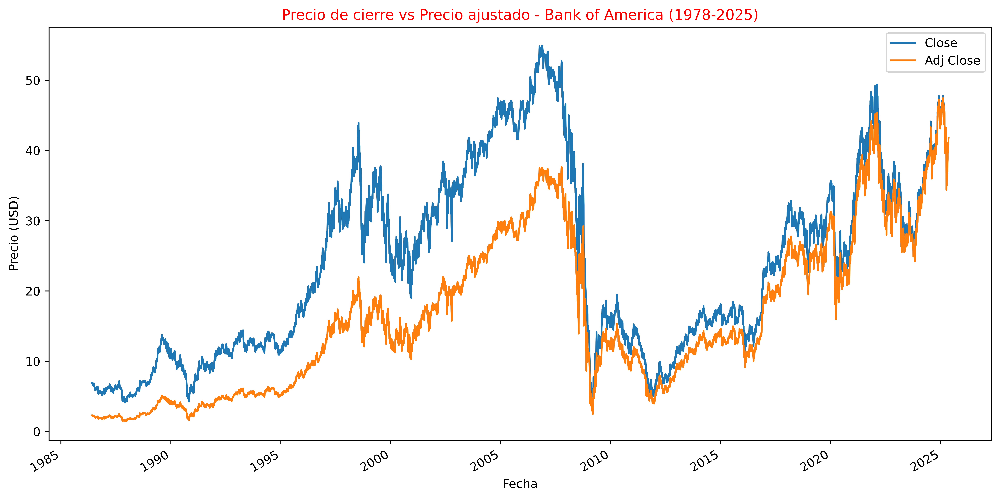

In [12]:
fig, ax = plt.subplots(figsize=(14, 7), dpi=800)

df['close'].plot(ax=ax, label='Close')
df['adj_close'].plot(ax=ax, label='Adj Close')

ax.set_title('Precio de cierre vs Precio ajustado - Bank of America (1978-2025)', c='red')
ax.set_xlabel('Fecha')
ax.set_ylabel('Precio (USD)')
ax.legend()

plt.show()

Una versión interactiva usando Plotly Express es mostrada a continuación:

In [13]:
# Paso 1: Convertir a formato largo (long format)
df_long = df[['close', 'adj_close']].reset_index().melt(
    id_vars='date',
    value_vars=['close', 'adj_close'],
    var_name='Tipo de precio',
    value_name='Precio'
)

# Paso 2: Gráfico interactivo
fig = px.line(
    df_long,
    x='date',
    y='Precio',
    color='Tipo de precio',
    title='Precio de cierre vs Precio ajustado - Bank of America (1978-2025)',
    labels={'date': 'Fecha', 'Precio': 'Precio (USD)', 'Tipo de precio': 'Tipo'}
)

# Personalizar diseño
fig.update_layout(
    title_font=dict(size=20),
    plot_bgcolor='white',
    xaxis=dict(showgrid=True, gridcolor='lightgray'),
    yaxis=dict(showgrid=True, gridcolor='lightgray')
)

fig.show()

c:\Users\sivam\anaconda3\Lib\site-packages\plotly\express\_core.py:1979: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  sf: grouped.get_group(s if len(s) > 1 else s[0])
c:\Users\sivam\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


#### Evolución histórica de `volume`:

In [14]:
print(df['volume'].nlargest(1))
print()
print(df['volume'].nsmallest(1))

date
2009-12-04    1.226791e+09
Name: volume, dtype: float64

date
1986-10-13    36000.0
Name: volume, dtype: float64


Vemos que la variabilidad de `volume` es demasiado alta...

##### *Grafiquemos esta variable para observar mejor su comportamiento:*

In [15]:
# ============================
# 3. Volumen
# ============================
plt.figure(figsize=(14,5), dpi=1600)
plt.bar(df.index, df['volume'], width=2, color='gray')
plt.title("Volumen diario (escala logarítmica)", c='red')
plt.xlabel("Fecha")
plt.ylabel("Acciones negociadas")
plt.yscale('log')   # Escala logarítmica para mejor visualización, pues hay demasiada variabilidad en los volúmenes.
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

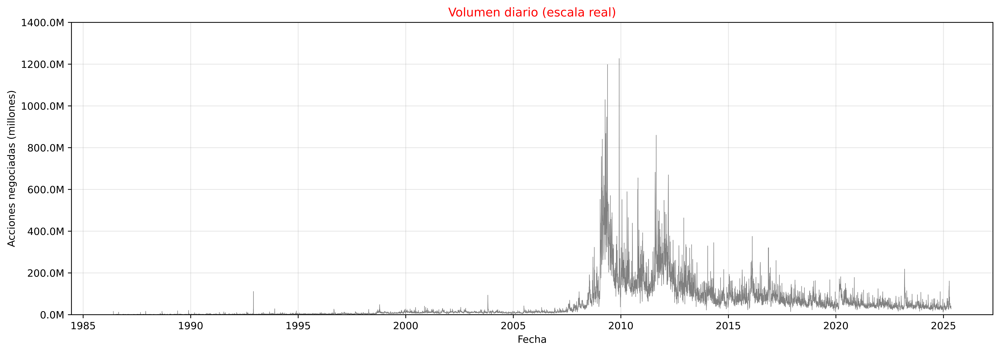

In [16]:
import matplotlib.ticker as mticker

plt.figure(figsize=(14, 5), dpi=800)
plt.plot(df.index, df['volume'] / 1e6, color='gray', linewidth=0.5)
plt.title("Volumen diario (escala real)", c='red')
plt.xlabel("Fecha")
plt.ylabel("Acciones negociadas (millones)")

# Formatear eje Y para mostrar como "1.2M", "2.5M", etc.
ax = plt.gca()
ax.yaxis.set_major_formatter(mticker.FuncFormatter(lambda x, p: f'{x:.1f}M'))

plt.ylim(0, 1400)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

#### Evolución histórica de la volatilidad móvil con ventana de 30 días:

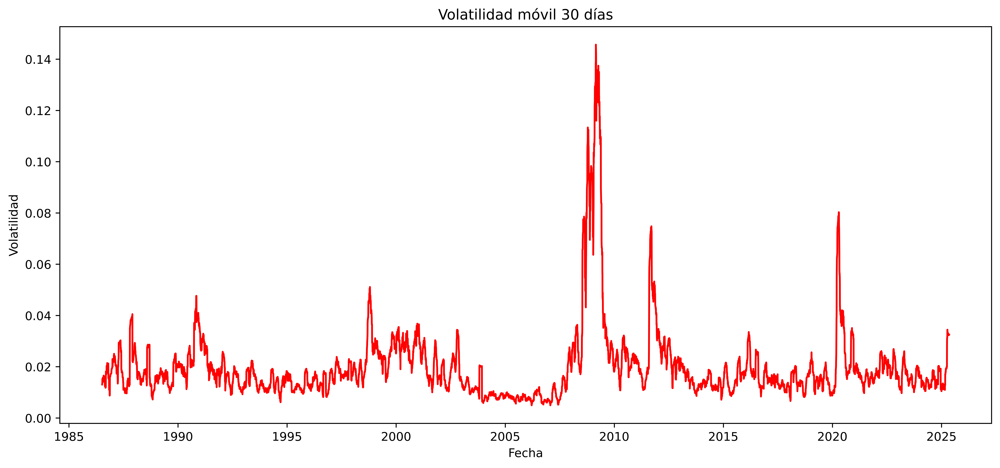

In [17]:
# ============================
# 4. Rendimientos y volatilidad
# ============================
df['returns'] = df['adj_close'].pct_change()
df['volatility_30d'] = df['returns'].rolling(30).std()

plt.figure(figsize=(14,6), dpi=800)
plt.plot(df.index, df['volatility_30d'], color='red')
plt.title("Volatilidad móvil 30 días")
plt.xlabel("Fecha")
plt.ylabel("Volatilidad")
plt.show()

#### Medias móviles para 20 y 200 días:

In [18]:
# ============================
# 5. Medias móviles
# ============================
df['SMA20'] = df['adj_close'].rolling(20).mean()
df['SMA200'] = df['adj_close'].rolling(200).mean()

plt.figure(figsize=(14,6), dpi=800)
plt.plot(df.index, df['adj_close'], label='Adj Close', alpha=0.6)
plt.plot(df.index, df['SMA20'], label='SMA 20d')
plt.plot(df.index, df['SMA200'], label='SMA 200d')
plt.title("Medias móviles")
plt.xlabel("Fecha")
plt.ylabel("USD")
plt.legend()
plt.tight_layout()
plt.show()

#### Estacionalidad mensual y semanal:

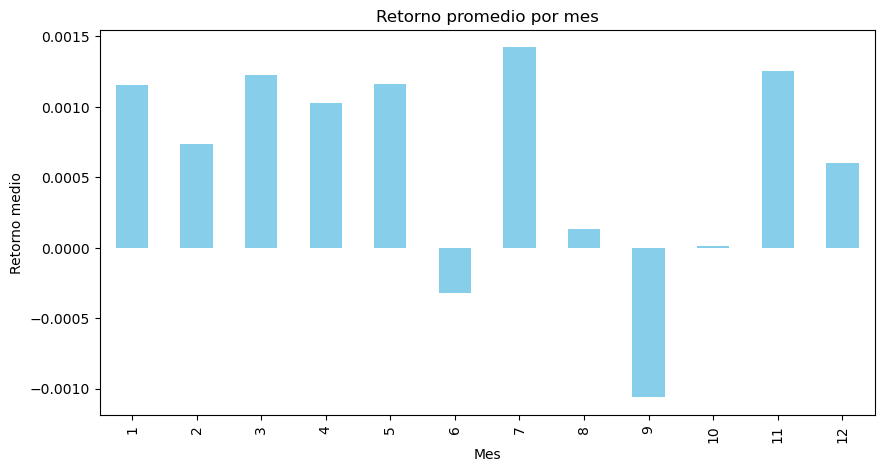

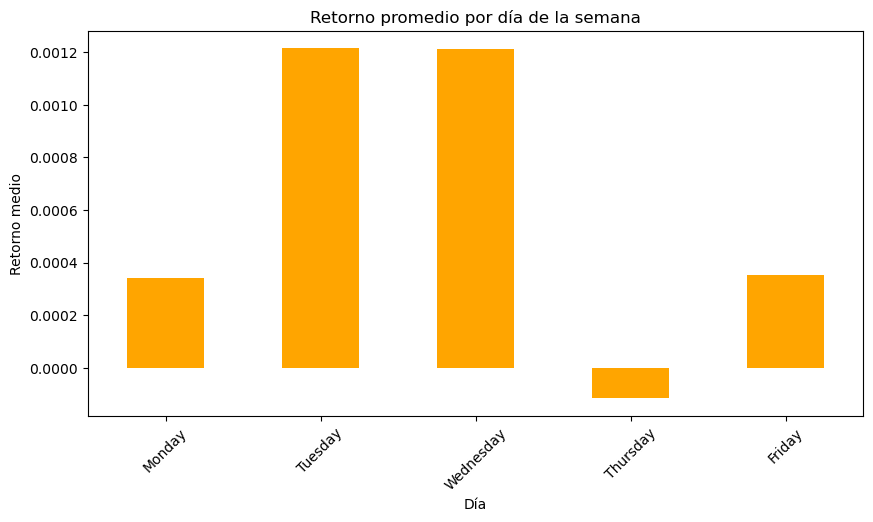

In [19]:
# ============================
# 7. Estacionalidad
# ============================
df['month'] = df.index.month
df['year'] = df.index.year
df['weekday'] = df.index.day_name()

monthly_returns = df.groupby('month')['returns'].mean()
plt.figure(figsize=(10,5))
monthly_returns.plot(kind='bar', color='skyblue')
plt.title("Retorno promedio por mes")
plt.xlabel("Mes")
plt.ylabel("Retorno medio")
plt.show()

print()

weekday_returns = df.groupby('weekday')['returns'].mean()
plt.figure(figsize=(10,5))
weekday_returns.reindex(['Monday','Tuesday','Wednesday','Thursday','Friday']).plot(kind='bar', color='orange')
plt.title("Retorno promedio por día de la semana")
plt.xlabel("Día")
plt.ylabel("Retorno medio")
plt.xticks(rotation= 45)
plt.show()

### ***[ 3 ]*** Top 10 de mayores subidas y bajadas del precio de la acción:

In [20]:
# ============================
# 6. Mayores subidas y caídas
# ============================
print("--- Mayores subidas ---")
display(df['returns'].nlargest(10))

print("\n--- Mayores caídas ---")
display(df['returns'].nsmallest(10))

--- Mayores subidas ---


date
2009-04-09    0.352691
2009-01-21    0.309803
2009-03-10    0.277333
2008-11-24    0.272014
2009-02-06    0.266528
2009-03-23    0.260097
2008-09-19    0.225638
2008-07-16    0.224082
2009-03-18    0.223285
2009-02-24    0.209719
Name: returns, dtype: float64


--- Mayores caídas ---


date
2009-01-20   -0.289693
2008-10-07   -0.262259
2009-02-27   -0.257519
2009-04-20   -0.243396
2008-09-15   -0.213101
2008-12-01   -0.209231
2011-08-08   -0.203182
2009-02-10   -0.193034
1987-10-19   -0.184971
2009-01-15   -0.184314
Name: returns, dtype: float64

### ***[ 4 ]*** Matriz de correlación:

#### Para Dataset original:

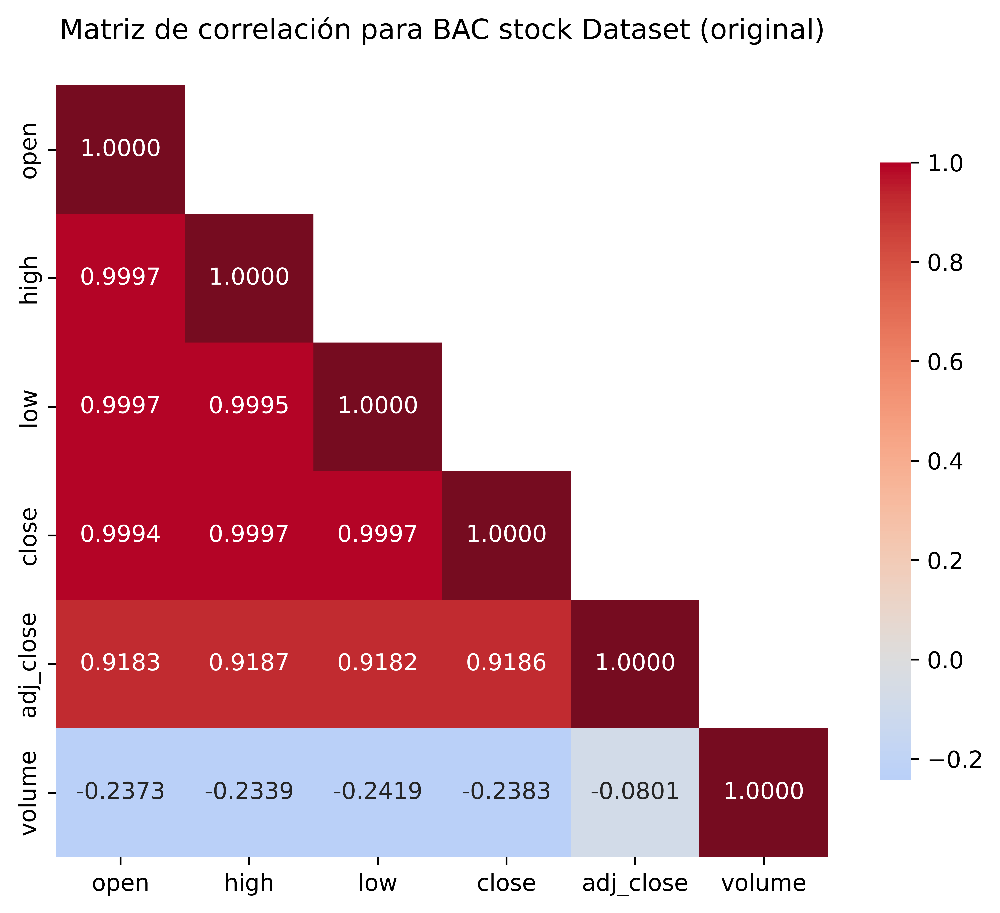

In [21]:
import matplotlib.patches as patches


# Calcular la matriz de correlación
corr_matrix = df[['open', 'high', 'low', 'close', 'adj_close', 'volume']].corr()

# Crear máscara para ocultar el triángulo superior (sin incluir diagonal)
mask = np.triu(np.ones_like(corr_matrix, dtype=bool), k=1)

# Configurar figura
plt.figure(figsize=(8, 6), dpi=1000)
ax = plt.gca()  # Obtener eje actual

# Dibujar el heatmap normal (sin la parte superior)
sns.heatmap(
    corr_matrix,
    mask=mask,
    annot=True,
    cmap='coolwarm',
    fmt=".4f",  # Redondear a 4 decimales.
    center=0,
    square=True,
    cbar_kws={"shrink": .8},
    ax=ax
)

# Resaltar la diagonal principal: agregar cuadrados de color distinto
cmap_diag = plt.cm.gray  # Puedes cambiarlo a otro colormap (ej: 'Greys', 'Wistia', 'Set1')
diag_color = cmap_diag(0.1)  # Color suave (ajustable)

for i in range(len(corr_matrix)):
    # Dibujar un cuadrado en cada celda de la diagonal
    square = patches.Rectangle(
        (i, i), 1, 1, linewidth=0, edgecolor='none',
        facecolor=diag_color, alpha=0.4  # Color semitransparente
    )
    ax.add_patch(square)

# Ajustar título
plt.title("Matriz de correlación para BAC stock Dataset (original)", pad=20)
plt.show()

#### Para Dataset enriquecido:

In [22]:
df.columns.tolist()  # Mostrar nombres de las columnas del DataFrame

['open',
 'high',
 'low',
 'close',
 'adj_close',
 'volume',
 'returns',
 'volatility_30d',
 'SMA20',
 'SMA200',
 'month',
 'year',
 'weekday']

In [23]:
# Calcular la matriz de correlación
corr_matrix_2 = df[df.columns.to_list()[:-3]].corr()    ## todas las columnas menos las últimas 3 (month, year, weekday)

# Crear máscara para ocultar el triángulo superior (sin incluir diagonal)
mask = np.triu(np.ones_like(corr_matrix_2, dtype=bool), k=1)

# Configurar figura
plt.figure(figsize=(12, 9), dpi=1000)
ax = plt.gca()  # Obtener eje actual

# Dibujar el heatmap normal (sin la parte superior)
sns.heatmap(
    corr_matrix_2,
    mask=mask,
    annot=True,
    cmap='coolwarm',
    fmt=".4f",  # Redondear a 4 decimales.
    center=0,
    square=True,
    cbar_kws={"shrink": .8},
    ax=ax
)

# Resaltar la diagonal principal: agregar cuadrados de color distinto
cmap_diag = plt.cm.gray  # Puedes cambiarlo a otro colormap (ej: 'Greys', 'Wistia', 'Set1')
diag_color = cmap_diag(0.1)  # Color suave (ajustable)

for i in range(len(corr_matrix_2)):
    # Dibujar un cuadrado en cada celda de la diagonal
    square = patches.Rectangle(
        (i, i), 1, 1, linewidth=0, edgecolor='none',
        facecolor=diag_color, alpha=0.4  # Color semitransparente
    )
    ax.add_patch(square)

# Ajustar título
plt.title("Matriz de correlación para BAC stock Dataset (enriquecido)", pad=20)
plt.show()

### ***[ 5 ]*** Guardar el DF (opcional):

In [24]:
# ============================
# Guardar dataset enriquecido (opcional)
# ============================
answer = input("Desea guardar el dataset enriquecido? (s/n): ").strip().lower()
print()
if answer == "s":
    file_name = "BAC_preprocessed_enriched.csv"
    df.to_csv(file_name)
    print(f"✅ Dataset enriquecido guardado en '{file_name}' ")
elif answer == "n":
    print("Dataset no guardado.")
else:
    print("Opción no válida. Dataset no guardado.")


Dataset no guardado.


##  3️⃣ Completación del Preprocesamiento:

### ***[ 1 ]*** Tratamiento de ***nuevos*** datos nulos:

In [25]:
df.isna().sum().sum()

249

⚠️ Hay datos nulos!!!

In [26]:
df.isna().sum()

open                0
high                0
low                 0
close               0
adj_close           0
volume              0
returns             1
volatility_30d     30
SMA20              19
SMA200            199
month               0
year                0
weekday             0
dtype: int64

➡️ ***Fun Fact:*** al crear nuevas variables en el proceso de *Feature Engineering*, creamos celdas con valores nulos en el DF; debemos tratar este problema, y nuevamente, la opción más sencilla y por la que me decantaré, será la de eliminar los primeros 199 registros, que son los que presentan valores nulos...

In [27]:
df.drop(index=df.index[:199], inplace=True)
#df.reset_index(drop=True, inplace=True)

print(f"Total de valores nulos en el nuevo DF:\n  {int(df.isna().sum().sum())}")

Total de valores nulos en el nuevo DF:
  0


In [28]:
df

,open,high,low,close,adj_close,volume,returns,volatility_30d,SMA20,SMA200,month,year,weekday
date,,,,,,,,,,,,,
1987-03-12,6.156250,6.437500,6.156250,6.406250,2.193416,547600.0,0.030151,0.017973,2.122574,2.028597,3,1987,Thursday
1987-03-13,6.406250,6.500000,6.343750,6.437500,2.204115,290000.0,0.004878,0.017448,2.130400,2.028199,3,1987,Friday
1987-03-16,6.468750,6.468750,6.281250,6.406250,2.193416,381600.0,-0.004854,0.017449,2.132917,2.027669,3,1987,Monday
1987-03-17,6.343750,6.437500,6.312500,6.437500,2.204115,550800.0,0.004878,0.017282,2.137561,2.027218,3,1987,Tuesday
1987-03-18,6.437500,6.593750,6.406250,6.562500,2.246914,381600.0,0.019418,0.017508,2.144344,2.026903,3,1987,Wednesday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-05-05,40.849998,41.490002,40.619999,41.119999,41.119999,32829200.0,0.001217,0.032542,38.211500,41.998156,5,2025,Monday
2025-05-06,40.650002,41.270000,40.560001,40.840000,40.840000,29541800.0,-0.006809,0.032440,38.474500,41.991213,5,2025,Tuesday
2025-05-07,41.040001,41.340000,40.860001,40.930000,40.930000,30925900.0,0.002204,0.032427,38.769500,41.985260,5,2025,Wednesday


### ***[ 2 ]*** **Decisión importante:** Descartaré algunas variables:

Como pudimos observar en el EDA, existe una colinealidad exageradísimamente alta entre precios intradiarios, esto introduce redundancia y dificultará el entrenamiento de modelos lineales, y en modelos más complejos, aumentará el riesgo de overfitting...

Entonces, eliminaremos las siguientes variables:
+ `open`
+ `high`
+ `low`
+ `close`

Así, en cuanto a variables referentes al precio intradiario de la acción, nos quedaremos únicamente con `adj_close`.

In [29]:
# Eliminar columnas innecesarias
df_pruned = df.copy().drop(columns=['open', 'high', 'low', 'close'])
print(f"  `df_pruned` tiene {df_pruned.shape[0]} filas y {df_pruned.shape[1]} columnas.\n\n")
df_pruned   ## df_pruned = 'df podado'

  `df_pruned` tiene 9615 filas y 9 columnas.




,adj_close,volume,returns,volatility_30d,SMA20,SMA200,month,year,weekday
date,,,,,,,,,
1987-03-12,2.193416,547600.0,0.030151,0.017973,2.122574,2.028597,3,1987,Thursday
1987-03-13,2.204115,290000.0,0.004878,0.017448,2.130400,2.028199,3,1987,Friday
1987-03-16,2.193416,381600.0,-0.004854,0.017449,2.132917,2.027669,3,1987,Monday
1987-03-17,2.204115,550800.0,0.004878,0.017282,2.137561,2.027218,3,1987,Tuesday
1987-03-18,2.246914,381600.0,0.019418,0.017508,2.144344,2.026903,3,1987,Wednesday
...,...,...,...,...,...,...,...,...,...
2025-05-05,41.119999,32829200.0,0.001217,0.032542,38.211500,41.998156,5,2025,Monday
2025-05-06,40.840000,29541800.0,-0.006809,0.032440,38.474500,41.991213,5,2025,Tuesday
2025-05-07,40.930000,30925900.0,0.002204,0.032427,38.769500,41.985260,5,2025,Wednesday


In [30]:
# Calcular la matriz de correlación
corr_matrix_3 = df_pruned[df_pruned.columns.to_list()[:-1]].corr()

# Crear máscara para ocultar el triángulo superior (sin incluir diagonal)
mask = np.triu(np.ones_like(corr_matrix_3, dtype=bool), k=1)

# Configurar figura
plt.figure(figsize=(12, 8), dpi=1000)
ax = plt.gca()  # Obtener eje actual

# Dibujar el heatmap normal (sin la parte superior)
sns.heatmap(
    corr_matrix_3,
    mask=mask,
    annot=True,
    cmap='coolwarm',
    fmt=".4f",  # Redondear a 4 decimales.
    center=0,
    square=True,
    cbar_kws={"shrink": .8},
    ax=ax
)

# Resaltar la diagonal principal: agregar cuadrados de color distinto
cmap_diag = plt.cm.gray  # Puedes cambiarlo a otro colormap (ej: 'Greys', 'Wistia', 'Set1')
diag_color = cmap_diag(0.1)  # Color suave (ajustable)

for i in range(len(corr_matrix_3)):
    # Dibujar un cuadrado en cada celda de la diagonal
    square = patches.Rectangle(
        (i, i), 1, 1, linewidth=0, edgecolor='none',
        facecolor=diag_color, alpha=0.4  # Color semitransparente
    )
    ax.add_patch(square)

# Ajustar título
plt.title("Matriz de correlación para BAC stock Dataset (enriquecido + podado)", pad=20)
plt.show()

### ***[ 3 ]*** Hacer una copia y opcionalmente guardar el DF completamente proprocesado, únicamente a falta del escalamiento y del tratamiento de variables categóricas...

#### Para Dataset enriquecido completo (con todas las variables) :

In [31]:
df_enriched_no_nulls = df.copy() # DF preprocesado pero sin haber escalado variables numéricas ni tampoco codificado las variables categóricas...
del df  # Elimino df para liberar memoria.
df_enriched_no_nulls.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9615 entries, 1987-03-12 to 2025-05-09
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   open            9615 non-null   float64
 1   high            9615 non-null   float64
 2   low             9615 non-null   float64
 3   close           9615 non-null   float64
 4   adj_close       9615 non-null   float64
 5   volume          9615 non-null   float64
 6   returns         9615 non-null   float64
 7   volatility_30d  9615 non-null   float64
 8   SMA20           9615 non-null   float64
 9   SMA200          9615 non-null   float64
 10  month           9615 non-null   int32  
 11  year            9615 non-null   int32  
 12  weekday         9615 non-null   object 
dtypes: float64(10), int32(2), object(1)
memory usage: 976.5+ KB


In [32]:
answer = input("Desea guardar el dataset enriquecido (sin nulos)? (s/n): ").strip().lower()
print()
if answer == "s":
    file_name = "BAC_preprocessed_enriched_preprocessed(NOT_scaled_yet!!).csv"
    df_enriched_no_nulls.to_csv(file_name)
    print(f"✅ Dataset enriquecido guardado en '{file_name}' ")
elif answer == "n":
    print("Dataset no guardado.")
else:
    print("Opción no válida. Dataset no guardado.")


✅ Dataset enriquecido guardado en 'BAC_preprocessed_enriched_preprocessed(NOT_scaled_yet!!).csv' 


#### Para Dataset enriquecido y podado (sin las variables descartadas) :

In [33]:
df_pruned_no_nulls = df_pruned.copy() # DF podado y preprocesado pero sin haber escalado variables numéricas ni tampoco codificado las variables categóricas...
del df_pruned   # Elimino df_pruned para liberar memoria.
df_pruned_no_nulls.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9615 entries, 1987-03-12 to 2025-05-09
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   adj_close       9615 non-null   float64
 1   volume          9615 non-null   float64
 2   returns         9615 non-null   float64
 3   volatility_30d  9615 non-null   float64
 4   SMA20           9615 non-null   float64
 5   SMA200          9615 non-null   float64
 6   month           9615 non-null   int32  
 7   year            9615 non-null   int32  
 8   weekday         9615 non-null   object 
dtypes: float64(6), int32(2), object(1)
memory usage: 676.1+ KB


In [34]:
answer = input("Desea guardar el dataset enriquecido + podado (sin nulos)? (s/n): ").strip().lower()
print()
if answer == "s":
    file_name = "BAC_preprocessed_pruned_preprocessed(NOT_scaled_yet!!).csv"
    df_pruned_no_nulls.to_csv(file_name)
    print(f"✅ Dataset enriquecido guardado en '{file_name}' ")
elif answer == "n":
    print("Dataset no guardado.")
else:
    print("Opción no válida. Dataset no guardado.")


✅ Dataset enriquecido guardado en 'BAC_preprocessed_pruned_preprocessed(NOT_scaled_yet!!).csv' 


### ➡️ Ya con esto concluimos la fase de preprocesamiento y nuestro dataset queda totalmente listo para el trabajo...

### ⚠️⚠️⚠️ Falta escalar variables numéricas y tratar debidamente variables categóricas (lo haremos más adelante)...

## 4️⃣ Data Splitting + Tratamiento diferenciado de variables categóricas y numéricas:

In [35]:
# ============================================================
# 0. Setup inicial
# ============================================================
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import TimeSeriesSplit
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import joblib
import os

# ============================================================
# 1. Crear múltiples targets (precio, retorno, dirección)
# ============================================================
df_pruned_no_nulls['adj_close_next'] = df_pruned_no_nulls['adj_close'].shift(-1)                   # precio siguiente
df_pruned_no_nulls['return_next'] = df_pruned_no_nulls['returns'].shift(-1)                # retorno siguiente
df_pruned_no_nulls['direction_next'] = (df_pruned_no_nulls['return_next'] > 0).astype(int) # 1=sube, 0=baja

df_pruned_no_nulls.dropna(subset=['adj_close_next', 'return_next'], inplace=True)   # Ya con tratar los nulos en 'return_next', quedan tratados los posibles nulos en 'direction_next'...


# ============================================================
# 2. Transformaciones determinísticas (antes del split)
# ============================================================
# 2.1 Log transform volumen
if 'volume' in df_pruned_no_nulls.columns:
    df_pruned_no_nulls['volume'] = np.log1p(df_pruned_no_nulls['volume'])

# 2.2 Encoding cíclico (month, weekday)
df_pruned_no_nulls['month_sin'] = np.sin(2 * np.pi * df_pruned_no_nulls.index.month / 12)
df_pruned_no_nulls['month_cos'] = np.cos(2 * np.pi * df_pruned_no_nulls.index.month / 12)

# Determinar si el dataset incluye fines de semana
unique_weekdays = df_pruned_no_nulls.index.weekday.unique()
has_weekend = any(d in [5, 6] for d in unique_weekdays)
period_week = 7 if has_weekend else 5

df_pruned_no_nulls['weekday_num'] = df_pruned_no_nulls.index.weekday
df_pruned_no_nulls['weekday_sin'] = np.sin(2 * np.pi * df_pruned_no_nulls['weekday_num'] / period_week)
df_pruned_no_nulls['weekday_cos'] = np.cos(2 * np.pi * df_pruned_no_nulls['weekday_num'] / period_week)

df_pruned_no_nulls.drop(columns=['month', 'weekday', 'weekday_num'], inplace=True, errors='ignore')


# ============================================================
# 3. Configuración flexible de features y target
# ============================================================
numeric_cols = [
    'adj_close',
    'volume','returns','volatility_30d',
    'SMA20','SMA200','year'
]
cyclical_cols = ['month_sin','month_cos','weekday_sin','weekday_cos']

all_features = numeric_cols + cyclical_cols

# --- Cambiar solo esta línea para usar otro target ---
target_col = 'return_next'   # o 'adj_close_next' o 'direction_next'

# --- Preparar X, y ---
X = df_pruned_no_nulls[all_features].copy()
y = df_pruned_no_nulls[target_col].copy()

# Sanity Checks
if X.shape[0] != y.shape[0]:
    raise RuntimeError("❌ X e y tienen diferente número de filas.")
if X.isnull().any().any():
    raise RuntimeError("❌ Hay NaNs en X.")
if y.isnull().any():
    raise RuntimeError("❌ Hay NaNs en y.")


# ============================================================
# 4. Definir pipeline de preprocesamiento
# ============================================================
preprocessor = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), numeric_cols),
        ("cyc", "passthrough", cyclical_cols)  # dejará los senos/cosenos tal cual
    ]
)

base_pipeline = Pipeline(steps=[
    ("preprocessor", preprocessor)
])


# ============================================================
# 5. Walk-forward validation con pipeline
# ============================================================
n_splits = 6
tscv = TimeSeriesSplit(n_splits=n_splits)

folds_data = []

for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
    X_train, X_test = X.iloc[train_idx].copy(), X.iloc[test_idx].copy()
    y_train, y_test = y.iloc[train_idx].copy(), y.iloc[test_idx].copy()

    # Fit pipeline SOLO en train
    X_train_transformed = base_pipeline.fit_transform(X_train)
    X_test_transformed = base_pipeline.transform(X_test)

    ## Guardar pipeline completo por fold
    # Definir carpeta destino
    pipelines_dir = os.path.join(".", "pipelines")   # "." significa la carpeta actual
    # Crear carpeta si no existe
    os.makedirs(pipelines_dir, exist_ok=True)
    # Construir la ruta del archivo
    file_path = os.path.join(pipelines_dir, f"pipeline_fold_{fold+1}.joblib")
    # Guardar pipeline
    joblib.dump(base_pipeline, file_path)

    # Sanity Checks
    if np.isnan(X_train_transformed).any():
        raise RuntimeError(f"❌ NaNs en X_train fold {fold+1}")
    if np.isnan(X_test_transformed).any():
        raise RuntimeError(f"❌ NaNs en X_test fold {fold+1}")

    folds_data.append({
        "fold": fold+1,
        "train_idx": train_idx,
        "test_idx": test_idx,
        "X_train": X_train_transformed,
        "X_test": X_test_transformed,
        "y_train": y_train,
        "y_test": y_test,
        "pipeline": base_pipeline
    })

    print(f"✅ Fold {fold+1} listo → Train: {X_train_transformed.shape}, Test: {X_test_transformed.shape}")

print(f"\n🎯 Preparación completa: {len(folds_data)} folds listos...")

✅ Fold 1 listo → Train: (1376, 11), Test: (1373, 11)
✅ Fold 2 listo → Train: (2749, 11), Test: (1373, 11)
✅ Fold 3 listo → Train: (4122, 11), Test: (1373, 11)
✅ Fold 4 listo → Train: (5495, 11), Test: (1373, 11)
✅ Fold 5 listo → Train: (6868, 11), Test: (1373, 11)
✅ Fold 6 listo → Train: (8241, 11), Test: (1373, 11)

🎯 Preparación completa: 6 folds listos...


## 5️⃣ :

In [ ]:
"""
Pipeline reproducible para la PRIMERA tanda de modelos (lineales -> regresión / clasificación
optimizada para series temporales). Diseñado para correr sobre cualquier DataFrame con índex
DatetimeIndex y columnas convencionales (adj_close, returns, volume, volatility_30d, SMA20, SMA200, etc.).

Funciones principales:
- prepare_dataframe(...)
- build_time_series_folds(...)
- train_and_evaluate_linear_models(...)

Salida: scalers por fold y modelos guardados por fold (si se pide).

"""

import os
import warnings
from typing import Dict, List, Tuple, Optional

import joblib
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import (ElasticNetCV, LassoCV, LinearRegression,
                                  LogisticRegressionCV, RidgeCV)
from sklearn.metrics import (accuracy_score, f1_score, mean_absolute_error,
                             mean_squared_error, precision_score, recall_score,
                             r2_score, roc_auc_score)
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit

warnings.filterwarnings("ignore")   # Ignorar warnings para no saturar la salida.


# --------------------------
# 1) Preparación del dataframe
# --------------------------

def prepare_dataframe(
    df: pd.DataFrame,
    create_targets: bool = True,
    log_volume: bool = True,
    lag_specs: Optional[Dict[str, List[int]]] = None,
    rolling_specs: Optional[Dict[str, List[int]]] = None,
    dropna_after: bool = True,
    target_cols_to_keep: Optional[List[str]] = None,
) -> Tuple[pd.DataFrame, List[str]]:
    """
    Crea targets (opcional), transformaciones determinísticas y genera lags/rolling.

    Args:
        df: DataFrame con DatetimeIndex.
        create_targets: si True crea 'y_next','return_next','direction_next'.
        log_volume: aplicar np.log1p sobre 'volume' si existe.
        lag_specs: dict con formato {'returns': [1,5,20], 'volume': [1]}.
                  Si None, se usan lags por defecto para variables relevantes.
        rolling_specs: dict con formato {'returns': [5,10], ...} o None.
        dropna_after: si True hará df.dropna() sobre las columnas que generó + targets.
        target_cols_to_keep: lista con nombres de target que quieres mantener (por ejemplo
                             ['return_next']). Si None mantiene los tres creados.

    Returns:
        df_proc: DataFrame copiado y procesado.
        feature_cols: lista ordenada de columnas de features resultantes (usables en X).
    """
    df_proc = df.copy()

    # --- 1. Targets (precio, retorno, dirección) ---
    if create_targets:
        df_proc['adj_close'] = df_proc['adj_close'].shift(-1)
        df_proc['return_next'] = df_proc['returns'].shift(-1)
        df_proc['direction_next'] = (df_proc['return_next'] > 0).astype(int)

        # Si el usuario quiere conservar solo ciertos targets
        if target_cols_to_keep is not None:
            keep = set(target_cols_to_keep)
        else:
            keep = {'y_next', 'return_next', 'direction_next'}

        # Eliminamos filas con NaN en los targets obligatorios
        df_proc.dropna(subset=[c for c in keep if c in df_proc.columns], inplace=True)

    # --- 2. Determinísticos antes del split ---
    if log_volume and 'volume' in df_proc.columns:
        df_proc['volume'] = np.log1p(df_proc['volume'])

    # Encoding cíclico si hay 'month' o si el índice es DatetimeIndex
    if hasattr(df_proc.index, 'month'):
        df_proc['month_sin'] = np.sin(2 * np.pi * df_proc.index.month / 12)
        df_proc['month_cos'] = np.cos(2 * np.pi * df_proc.index.month / 12)

    # weekday: si existe columna 'weekday' en df_original la respetamos, sino sacamos desde index
    if 'weekday' in df_proc.columns:
        weekday_values = pd.to_numeric(df_proc['weekday'], errors='coerce')
    else:
        weekday_values = df_proc.index.weekday

    unique_weekdays = np.unique(weekday_values[~pd.isnull(weekday_values)])
    has_weekend = any(d in [5, 6] for d in unique_weekdays)
    period_week = 7 if has_weekend else 5

    df_proc['weekday_num'] = weekday_values
    df_proc['weekday_sin'] = np.sin(2 * np.pi * df_proc['weekday_num'] / period_week)
    df_proc['weekday_cos'] = np.cos(2 * np.pi * df_proc['weekday_num'] / period_week)

    # Intentamos limpiar columnas original si existían
    for col in ['month', 'weekday', 'weekday_num']:
        if col in df_proc.columns:
            try:
                df_proc.drop(columns=[col], inplace=True)
            except Exception:
                pass

    # --- 3. Lags y rolling ---
    # Defaults razonables para la primera tanda (lineales)
    if lag_specs is None:
        lag_specs = {
            'returns': [1, 5, 20],
            'volume': [1, 5],
            'volatility_30d': [1],
            'adj_close': [1]
        }
    if rolling_specs is None:
        rolling_specs = {
            'returns': [5, 10],
            'adj_close': [10]
        }

    generated = []

    for col, lags in lag_specs.items():
        if col in df_proc.columns:
            for lag in sorted(set(lags)):
                newcol = f"{col}_lag{lag}"
                df_proc[newcol] = df_proc[col].shift(lag)
                generated.append(newcol)

    for col, windows in rolling_specs.items():
        if col in df_proc.columns:
            for w in sorted(set(windows)):
                mean_col = f"{col}_rmean{w}"
                std_col = f"{col}_rstd{w}"
                df_proc[mean_col] = df_proc[col].rolling(window=w, min_periods=1).mean()
                df_proc[std_col] = df_proc[col].rolling(window=w, min_periods=1).std().fillna(0)
                generated.extend([mean_col, std_col])

    # Columnas cíclicas
    cyclical_cols = [c for c in df_proc.columns if c.endswith('_sin') or c.endswith('_cos')]

    # Composición final de features (ordenada)
    feature_cols = []
    # primero variables base si existen
    base_order = ['adj_close', 'volume', 'returns', 'volatility_30d', 'SMA20', 'SMA200', 'year']
    for b in base_order:
        if b in df_proc.columns:
            feature_cols.append(b)
    # luego generadas (lags y rolling)
    feature_cols += [c for c in generated if c in df_proc.columns]
    # por último las cíclicas
    feature_cols += cyclical_cols

    # Drop NaNs si se pidió (habitualmente necesario por los lags)
    if dropna_after:
        must_have = feature_cols.copy()
        if create_targets:
            # incluir los targets que quedaron en el df (porque el usuario pudo pedir subset)
            target_cols = [c for c in ['y_next', 'return_next', 'direction_next'] if c in df_proc.columns]
            must_have += target_cols
        df_proc.dropna(subset=must_have, inplace=True)

    # Aseguramos que feature_cols existan
    feature_cols = [c for c in feature_cols if c in df_proc.columns]

    return df_proc, feature_cols


# --------------------------
# 2) Crear folds con TimeSeriesSplit y pipeline estandarizado
# --------------------------

def build_time_series_folds(
    df: pd.DataFrame,
    feature_cols: List[str],
    target_col: str,
    n_splits: int = 6,
    dataset_name: str = 'dataset',
    save_scalers_dir: str = 'scalers',
):
    """
    Ejecuta TimeSeriesSplit y aplica ColumnTransformer (StandardScaler a num cols).
    Guarda scalers por fold en save_scalers_dir/{dataset_name}/scaler_fold_{k}.joblib

    Retorna lista de diccionarios con X_train, X_test (transformados), y_train, y_test, indices y scaler.
    """
    os.makedirs(save_scalers_dir, exist_ok=True)
    os.makedirs(os.path.join(save_scalers_dir, dataset_name), exist_ok=True)

    X = df[feature_cols].copy()
    y = df[target_col].copy()

    # Sanity
    if X.shape[0] != y.shape[0]:
        raise RuntimeError("❌ X e y tienen diferente número de filas.")
    if X.isnull().any().any():
        raise RuntimeError("❌ Hay NaNs en X. Revisa la creación de lags/rolling.")
    if y.isnull().any():
        raise RuntimeError("❌ Hay NaNs en y.")

    # Separar columnas cíclicas (sin/cos) para que no se escalen
    cyclical_cols = [c for c in feature_cols if c.endswith('_sin') or c.endswith('_cos')]
    numeric_cols = [c for c in feature_cols if c not in cyclical_cols]

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", StandardScaler(), numeric_cols),
            ("cyc", "passthrough", cyclical_cols),
        ]
    )

    base_pipeline = Pipeline(steps=[("preprocessor", preprocessor)])

    tscv = TimeSeriesSplit(n_splits=n_splits)
    folds_data = []

    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X.iloc[train_idx].copy(), X.iloc[test_idx].copy()
        y_train, y_test = y.iloc[train_idx].copy(), y.iloc[test_idx].copy()

        X_train_transformed = base_pipeline.fit_transform(X_train)
        X_test_transformed = base_pipeline.transform(X_test)

        scaler = base_pipeline.named_steps['preprocessor'].named_transformers_["num"]
        scaler_path = os.path.join(save_scalers_dir, dataset_name, f"scaler_fold_{fold+1}.joblib")
        joblib.dump(scaler, scaler_path)

        # Sanity checks
        if np.isnan(X_train_transformed).any():
            raise RuntimeError(f"❌ NaNs en X_train fold {fold+1}")
        if np.isnan(X_test_transformed).any():
            raise RuntimeError(f"❌ NaNs en X_test fold {fold+1}")

        folds_data.append({
            "fold": fold + 1,
            "train_idx": train_idx,
            "test_idx": test_idx,
            "X_train": X_train_transformed,
            "X_test": X_test_transformed,
            "y_train": y_train.to_numpy(),
            "y_test": y_test.to_numpy(),
            "scaler": scaler,
            "scaler_path": scaler_path,
        })

        print(f"✅ Fold {fold+1} listo → Train: {X_train_transformed.shape}, Test: {X_test_transformed.shape}")

    print(f"\n🎯 Preparación completa: {len(folds_data)} folds listos para '{target_col}'...\n\n")
    return folds_data


# --------------------------
# 3) Entrenar y evaluar modelos lineales por fold
# --------------------------

def train_and_evaluate_linear_models(
    folds_data: List[dict],
    target_type: str = 'regression',
    save_models_dir: str = 'models',
    dataset_name: str = 'dataset',
    models: Optional[Dict[str, object]] = None,
    model_grids: Optional[Dict[str, Tuple[object, dict]]] = None,
    gs_cv: int = 3,
    n_jobs: int = -1,
    verbose: bool = True,
) -> pd.DataFrame:
    """
    Para cada fold entrena los modelos entregados (o los por defecto) y evalúa.

    Ahora soporta dos modos:
    - `model_grids`: dict {name: (estimator, param_grid)} -> usa GridSearchCV sobre TRAIN
    - `models`: dict {name: estimator} (sin búsqueda de hiperparámetros)

    Args:
        folds_data: salida de build_time_series_folds
        target_type: 'regression' o 'classification'
        save_models_dir: carpeta base para guardar modelos
        dataset_name: nombre del dataset (subcarpeta)
        models: dict opcional {'ridge': Ridge(), ...} (ajusta directamente)
        model_grids: dict opcional {'Ridge': (Ridge(), {'alpha':[0.1,1]})} -> aplica GridSearchCV
        gs_cv: folds internos para GridSearchCV (solo sobre train)
        n_jobs: número de jobs para GridSearchCV (y para .fit cuando aplique)
        verbose: si True imprime progreso detallado.

    Returns:
        df_results: DataFrame con métricas por fold y modelo.
    """
    os.makedirs(save_models_dir, exist_ok=True)
    os.makedirs(os.path.join(save_models_dir, dataset_name), exist_ok=True)

    # Modelos por defecto si no se pasan ni models ni model_grids
    if models is None and model_grids is None:
        if target_type == 'regression':
            models = {
                'LinearRegression': LinearRegression(),
                'RidgeCV': RidgeCV(alphas=np.logspace(-3, 3, 7)),
                'LassoCV': LassoCV(cv=5, max_iter=5000),
                'ElasticNetCV': ElasticNetCV(cv=5, max_iter=5000),
            }
        else:  # clasificación
            models = {
                'LogisticRegressionCV': LogisticRegressionCV(cv=5, max_iter=2000),
            }

    records = []

    for entry in folds_data:
        fold = entry['fold']
        X_train = entry['X_train']
        X_test = entry['X_test']
        y_train = entry['y_train']
        y_test = entry['y_test']

        if verbose:
            print(f"🔹 Fold {fold}: Train {X_train.shape}, Test {X_test.shape}")

        # Primero los modelos con GridSearch (si se pasaron)
        if model_grids is not None:
            for name, (estimator, param_grid) in model_grids.items():
                if verbose:
                    print(f"  ▶ [GridSearch] Entrenando {name} (fold {fold})...")
                try:
                    gs = GridSearchCV(
                        estimator=estimator,
                        param_grid=param_grid,
                        cv=gs_cv,
                        scoring='neg_mean_squared_error' if target_type == 'regression' else None,
                        n_jobs=n_jobs,
                        verbose=0,
                    )
                    gs.fit(X_train, y_train)

                    best = gs.best_estimator_
                    best_params = gs.best_params_
                    y_pred = best.predict(X_test)

                    # Métricas
                    if target_type == 'regression':
                        rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
                        mae = float(mean_absolute_error(y_test, y_pred))
                        r2 = float(r2_score(y_test, y_pred))

                        records.append({
                            'fold': fold,
                            'model': name,
                            'best_params': best_params,
                            'rmse': rmse,
                            'mae': mae,
                            'r2': r2,
                        })
                        if verbose:
                            print(f"    ✅ Mejor params: {best_params}")
                            print(f"    📉 RMSE: {rmse:.6f} | R²: {r2:.6f}")
                    else:
                        # clasificación
                        y_pred_label = (y_pred > 0.5).astype(int) if y_pred.ndim == 1 else y_pred
                        acc = float(accuracy_score(y_test, y_pred_label))
                        prec = float(precision_score(y_test, y_pred_label, zero_division=0))
                        rec = float(recall_score(y_test, y_pred_label, zero_division=0))
                        f1 = float(f1_score(y_test, y_pred_label, zero_division=0))
                        try:
                            if hasattr(best, 'predict_proba'):
                                y_score = best.predict_proba(X_test)[:, 1]
                                roc = float(roc_auc_score(y_test, y_score))
                            else:
                                roc = float(roc_auc_score(y_test, y_pred))
                        except Exception:
                            roc = np.nan

                        records.append({
                            'fold': fold,
                            'model': name,
                            'best_params': best_params,
                            'accuracy': acc,
                            'precision': prec,
                            'recall': rec,
                            'f1': f1,
                            'roc_auc': roc,
                        })
                        if verbose:
                            print(f"    ✅ Mejor params: {best_params}")
                            print(f"    🎯 Acc: {acc:.6f} | F1: {f1:.6f} | ROC_AUC: {roc}")

                    # Guardar mejor modelo
                    model_path = os.path.join(save_models_dir, dataset_name, f"{name}_fold{fold}.joblib")
                    joblib.dump(best, model_path)
                except Exception as e:
                    print(f"    ❌ Error entrenando {name} en fold {fold}: {e}")

        # Luego modelos sin GridSearch (fit directo)
        if models is not None:
            for name, mdl in models.items():
                if verbose:
                    print(f"  ▶ [Fit] Entrenando {name} (fold {fold})...")
                try:
                    mdl_fit = mdl
                    # si el estimador acepta n_jobs, intentar asignarlo
                    try:
                        if hasattr(mdl_fit, 'set_params'):
                            mdl_fit.set_params(**{'n_jobs': n_jobs})
                    except Exception:
                        pass

                    mdl_fit.fit(X_train, y_train)
                    y_pred = mdl_fit.predict(X_test)

                    if target_type == 'regression':
                        rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
                        mae = float(mean_absolute_error(y_test, y_pred))
                        r2 = float(r2_score(y_test, y_pred))

                        records.append({
                            'fold': fold,
                            'model': name,
                            'best_params': None,
                            'rmse': rmse,
                            'mae': mae,
                            'r2': r2,
                        })
                        if verbose:
                            print(f"    📉 RMSE: {rmse:.6f} | R²: {r2:.6f}")
                    else:
                        y_pred_label = (y_pred > 0.5).astype(int) if y_pred.ndim == 1 else y_pred
                        acc = float(accuracy_score(y_test, y_pred_label))
                        prec = float(precision_score(y_test, y_pred_label, zero_division=0))
                        rec = float(recall_score(y_test, y_pred_label, zero_division=0))
                        f1 = float(f1_score(y_test, y_pred_label, zero_division=0))
                        try:
                            if hasattr(mdl_fit, 'predict_proba'):
                                y_score = mdl_fit.predict_proba(X_test)[:, 1]
                                roc = float(roc_auc_score(y_test, y_score))
                            else:
                                roc = float(roc_auc_score(y_test, y_pred))
                        except Exception:
                            roc = np.nan

                        records.append({
                            'fold': fold,
                            'model': name,
                            'best_params': None,
                            'accuracy': acc,
                            'precision': prec,
                            'recall': rec,
                            'f1': f1,
                            'roc_auc': roc,
                        })
                        if verbose:
                            print(f"    🎯 Acc: {acc:.6f} | F1: {f1:.6f} | ROC_AUC: {roc}")

                    # Guardar modelo
                    model_path = os.path.join(save_models_dir, dataset_name, f"{name}_fold{fold}.joblib")
                    joblib.dump(mdl_fit, model_path)
                except Exception as e:
                    print(f"    ❌ Error entrenando {name} en fold {fold}: {e}")

    df_results = pd.DataFrame(records)
    return df_results


In [38]:
# --------------------------
# Ejemplo de uso - adaptarlo según nombres de variables/DFs
# --------------------------

# Ejemplo: preparar df_pruned_no_nulls con lags reducidos (para modelos lineales)
# df_pruned_no_nulls está asumido presente en el entorno si corres este archivo.
try:
    # Cambia el nombre del DF y el target según tu caso
    dataset_name = 'df_pruned'  ## o 'df_enriched' para el otro DF
    df_proc, feat_cols = prepare_dataframe(df_pruned_no_nulls, create_targets=True, dropna_after=True)
    print(df_proc.shape)
    print(df_proc.isna().sum().sort_values(ascending=False).head(15))
    print(f" `df_proc` tiene {df_proc.shape[0]} filas y {df_proc.shape[1]} columnas.\n\n")
    
    folds = build_time_series_folds(
        df_proc, feat_cols, target_col='return_next', n_splits=6, dataset_name=dataset_name
    )
    results = train_and_evaluate_linear_models(
        folds, target_type='regression', save_models_dir='models', dataset_name=dataset_name
    )
    print(f"\n\n\n🧩🧪 Resultados por fold y modelo ({dataset_name}) :")
    print(results.groupby('model')[['mae','rmse','r2']].mean())

except NameError:
    print('No se encontró `df_pruned_no_nulls` en el namespace. Importa el DF y vuelve a ejecutar...')


# Si quieres repetir exactamente lo mismo sobre df_enriched_no_nulls (antes de la poda):
# df_proc2, feat_cols2 = prepare_dataframe(df_enriched_no_nulls, create_targets=True)
# folds2 = build_time_series_folds(df_proc2, feat_cols2, target_col='return_next', n_splits=6, dataset_name='df_enriched')
# results2 = train_and_evaluate_linear_models(folds2, target_type='regression', save_models_dir='models', dataset_name='df_enriched')


(9593, 28)
adj_close              0
volume                 0
adj_close_rmean10      0
returns_rstd10         0
returns_rmean10        0
returns_rstd5          0
returns_rmean5         0
adj_close_lag1         0
volatility_30d_lag1    0
volume_lag5            0
volume_lag1            0
returns_lag20          0
returns_lag5           0
returns_lag1           0
y_next                 0
dtype: int64
 `df_proc` tiene 9593 filas y 28 columnas.


✅ Fold 1 listo → Train: (1373, 24), Test: (1370, 24)
✅ Fold 2 listo → Train: (2743, 24), Test: (1370, 24)
✅ Fold 3 listo → Train: (4113, 24), Test: (1370, 24)
✅ Fold 4 listo → Train: (5483, 24), Test: (1370, 24)
✅ Fold 5 listo → Train: (6853, 24), Test: (1370, 24)
✅ Fold 6 listo → Train: (8223, 24), Test: (1370, 24)

🎯 Preparación completa: 6 folds listos para 'return_next'...


🔹 Fold 1: Train (1373, 24), Test (1370, 24)
  ▶ [Fit] Entrenando LinearRegression (fold 1)...
    📉 RMSE: 0.019808 | R²: -0.772903
  ▶ [Fit] Entrenando RidgeCV (fold 1)...
  

In [39]:
df_pruned_no_nulls.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 9614 entries, 1987-03-12 to 2025-05-08
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   adj_close       9614 non-null   float64
 1   volume          9614 non-null   float64
 2   returns         9614 non-null   float64
 3   volatility_30d  9614 non-null   float64
 4   SMA20           9614 non-null   float64
 5   SMA200          9614 non-null   float64
 6   year            9614 non-null   int32  
 7   adj_close_next  9614 non-null   float64
 8   return_next     9614 non-null   float64
 9   direction_next  9614 non-null   int32  
 10  month_sin       9614 non-null   float64
 11  month_cos       9614 non-null   float64
 12  weekday_sin     9614 non-null   float64
 13  weekday_cos     9614 non-null   float64
dtypes: float64(12), int32(2)
memory usage: 1.0 MB


In [ ]:
df_enriched_no_nulls.info()

In [ ]:
try:
    # Cambia el nombre del DF y el target según tu caso
    dataset_name = 'df_enriched'  ## o 'df_enriched' si usas el otro DF
    df_proc2, feat_cols2 = prepare_dataframe(df_enriched_no_nulls, create_targets=True)
    folds2 = build_time_series_folds(
        df_proc2, feat_cols2, target_col='return_next', n_splits=6, dataset_name=dataset_name
    )
    results2 = train_and_evaluate_linear_models(
        folds2, target_type='regression', save_models_dir='models', dataset_name=dataset_name
    )
    print(f"\n\n\n🧩🧪 Resultados por fold y modelo ({dataset_name}) :")
    print(results.groupby('model')[['mae','rmse','r2']].mean())

except NameError:
    print('No se encontró `df_enriched_no_nulls` en el namespace. Importa tu DF y vuelve a ejecutar...')


# Si quieres repetir exactamente lo mismo sobre df_enriched_no_nulls (antes de la poda):
# df_proc2, feat_cols2 = prepare_dataframe(df_enriched_no_nulls, create_targets=True)
# folds2 = build_time_series_folds(df_proc2, feat_cols2, target_col='return_next', n_splits=6, dataset_name='df_enriched')
# results2 = train_and_evaluate_linear_models(folds2, target_type='regression', save_models_dir='models', dataset_name='df_enriched')


## SEGUNDA TANDA:

In [ ]:
"""
Pipeline reproducible para la SEGUNDA tanda de modelos (no lineales / árboles / boosting)
optimizada para series temporales. Diseñado para correr sobre cualquier DataFrame con índex
DatetimeIndex y columnas convencionales (adj_close, returns, volume, volatility_30d, SMA20, SMA200, etc.).

Funciones principales (misma lógica que la primera tanda):
- prepare_dataframe(...)
- build_time_series_folds(...)
- train_and_evaluate_advanced_models(...)

Salida: pipelines por fold y modelos guardados por fold (si se pide).
"""

import os
import warnings
from typing import Dict, List, Tuple, Optional

import joblib
import numpy as np
import pandas as pd
from sklearn.base import clone
from sklearn.compose import ColumnTransformer
from sklearn.metrics import (accuracy_score, f1_score, mean_absolute_error,
                             mean_squared_error, precision_score, recall_score,
                             r2_score, roc_auc_score)
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from sklearn.preprocessing import StandardScaler

# Modelos sklearn por defecto
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.ensemble import GradientBoostingRegressor, GradientBoostingClassifier
from sklearn.ensemble import HistGradientBoostingRegressor, HistGradientBoostingClassifier

# Intentar importar xgboost/lightgbm si están disponibles (opcionales)
try:
    from xgboost import XGBRegressor, XGBClassifier  # type: ignore
    _HAS_XGB = True
except Exception:
    _HAS_XGB = False

try:
    from lightgbm import LGBMRegressor, LGBMClassifier  # type: ignore
    _HAS_LGBM = True
except Exception:
    _HAS_LGBM = False

warnings.filterwarnings("ignore")


# --------------------------
# 1) Preparación del dataframe (idéntico a la primera tanda)
# --------------------------

def prepare_dataframe(
    df: pd.DataFrame,
    create_targets: bool = True,
    log_volume: bool = True,
    lag_specs: Optional[Dict[str, List[int]]] = None,
    rolling_specs: Optional[Dict[str, List[int]]] = None,
    dropna_after: bool = True,
    target_cols_to_keep: Optional[List[str]] = None,
) -> Tuple[pd.DataFrame, List[str]]:
    """
    Crea targets (opcional), transformaciones determinísticas y genera lags/rolling.

    Args:
        df: DataFrame con DatetimeIndex.
        create_targets: si True crea 'y_next','return_next','direction_next'.
        log_volume: aplicar np.log1p sobre 'volume' si existe.
        lag_specs: dict con formato {'returns': [1,5,20], 'volume': [1]}.
                  Si None, se usan lags por defecto para variables relevantes.
        rolling_specs: dict con formato {'returns': [5,10], ...} o None.
        dropna_after: si True hará df.dropna() sobre las columnas que generó + targets.
        target_cols_to_keep: lista con nombres de target que quieres mantener (por ejemplo
                             ['return_next']). Si None mantiene los tres creados.

    Returns:
        df_proc: DataFrame copiado y procesado.
        feature_cols: lista ordenada de columnas de features resultantes (usables en X).
    """
    df_proc = df.copy()

    # --- 1. Targets (precio, retorno, dirección) ---
    if create_targets:
        df_proc['y_next'] = df_proc['adj_close'].shift(-1)
        df_proc['return_next'] = df_proc['returns'].shift(-1)
        df_proc['direction_next'] = (df_proc['return_next'] > 0).astype(int)

        if target_cols_to_keep is not None:
            keep = set(target_cols_to_keep)
        else:
            keep = {'y_next', 'return_next', 'direction_next'}

        df_proc.dropna(subset=[c for c in keep if c in df_proc.columns], inplace=True)

    # --- 2. Determinísticos antes del split ---
    if log_volume and 'volume' in df_proc.columns:
        df_proc['volume'] = np.log1p(df_proc['volume'])

    if hasattr(df_proc.index, 'month'):
        df_proc['month_sin'] = np.sin(2 * np.pi * df_proc.index.month / 12)
        df_proc['month_cos'] = np.cos(2 * np.pi * df_proc.index.month / 12)

    if 'weekday' in df_proc.columns:
        weekday_values = pd.to_numeric(df_proc['weekday'], errors='coerce')
    else:
        weekday_values = df_proc.index.weekday

    unique_weekdays = np.unique(weekday_values[~pd.isnull(weekday_values)])
    has_weekend = any(d in [5, 6] for d in unique_weekdays)
    period_week = 7 if has_weekend else 5

    df_proc['weekday_num'] = weekday_values
    df_proc['weekday_sin'] = np.sin(2 * np.pi * df_proc['weekday_num'] / period_week)
    df_proc['weekday_cos'] = np.cos(2 * np.pi * df_proc['weekday_num'] / period_week)

    for col in ['month', 'weekday', 'weekday_num']:
        if col in df_proc.columns:
            try:
                df_proc.drop(columns=[col], inplace=True)
            except Exception:
                pass

    # --- 3. Lags y rolling ---
    if lag_specs is None:
        lag_specs = {
            'returns': [1, 5, 20],
            'volume': [1, 5],
            'volatility_30d': [1],
            'adj_close': [1]
        }
    if rolling_specs is None:
        rolling_specs = {
            'returns': [5, 10],
            'adj_close': [10]
        }

    generated = []

    for col, lags in lag_specs.items():
        if col in df_proc.columns:
            for lag in sorted(set(lags)):
                newcol = f"{col}_lag{lag}"
                df_proc[newcol] = df_proc[col].shift(lag)
                generated.append(newcol)

    for col, windows in rolling_specs.items():
        if col in df_proc.columns:
            for w in sorted(set(windows)):
                mean_col = f"{col}_rmean{w}"
                std_col = f"{col}_rstd{w}"
                df_proc[mean_col] = df_proc[col].rolling(window=w, min_periods=1).mean()
                df_proc[std_col] = df_proc[col].rolling(window=w, min_periods=1).std().fillna(0)
                generated.extend([mean_col, std_col])

    cyclical_cols = [c for c in df_proc.columns if c.endswith('_sin') or c.endswith('_cos')]

    feature_cols = []
    base_order = ['adj_close', 'volume', 'returns', 'volatility_30d', 'SMA20', 'SMA200', 'year']
    for b in base_order:
        if b in df_proc.columns:
            feature_cols.append(b)
    feature_cols += [c for c in generated if c in df_proc.columns]
    feature_cols += cyclical_cols

    if dropna_after:
        must_have = feature_cols.copy()
        if create_targets:
            target_cols = [c for c in ['y_next', 'return_next', 'direction_next'] if c in df_proc.columns]
            must_have += target_cols
        df_proc.dropna(subset=must_have, inplace=True)

    feature_cols = [c for c in feature_cols if c in df_proc.columns]

    return df_proc, feature_cols


# --------------------------
# 2) Crear folds con TimeSeriesSplit y pipeline estandarizado (idéntico salvo nombres)
# --------------------------

def build_time_series_folds(
    df: pd.DataFrame,
    feature_cols: List[str],
    target_col: str,
    n_splits: int = 6,
    dataset_name: str = 'dataset',
    save_pipelines_dir: str = 'pipelines',
):
    """
    Ejecuta TimeSeriesSplit y aplica ColumnTransformer (StandardScaler a num cols).
    Guarda pipeline completo por fold en save_pipelines_dir/{dataset_name}/pipeline_fold_{k}.joblib

    Retorna lista de diccionarios con X_train, X_test (transformados), y_train, y_test, indices y pipeline.
    """
    os.makedirs(save_pipelines_dir, exist_ok=True)
    os.makedirs(os.path.join(save_pipelines_dir, dataset_name), exist_ok=True)

    X = df[feature_cols].copy()
    y = df[target_col].copy()

    if X.shape[0] != y.shape[0]:
        raise RuntimeError("❌ X e y tienen diferente número de filas.")
    if X.isnull().any().any():
        raise RuntimeError("❌ Hay NaNs en X. Revisa la creación de lags/rolling.")
    if y.isnull().any():
        raise RuntimeError("❌ Hay NaNs en y.")

    cyclical_cols = [c for c in feature_cols if c.endswith('_sin') or c.endswith('_cos')]
    numeric_cols = [c for c in feature_cols if c not in cyclical_cols]

    preprocessor = ColumnTransformer(
        transformers=[
            ("num", StandardScaler(), numeric_cols),
            ("cyc", "passthrough", cyclical_cols),
        ]
    )

    base_pipeline = Pipeline(steps=[("preprocessor", preprocessor)])

    tscv = TimeSeriesSplit(n_splits=n_splits)
    folds_data = []

    for fold, (train_idx, test_idx) in enumerate(tscv.split(X)):
        X_train, X_test = X.iloc[train_idx].copy(), X.iloc[test_idx].copy()
        y_train, y_test = y.iloc[train_idx].copy(), y.iloc[test_idx].copy()

        X_train_transformed = base_pipeline.fit_transform(X_train)
        X_test_transformed = base_pipeline.transform(X_test)

        pipeline_path = os.path.join(save_pipelines_dir, dataset_name, f"pipeline_fold_{fold+1}.joblib")
        joblib.dump(base_pipeline, pipeline_path)

        if np.isnan(X_train_transformed).any():
            raise RuntimeError(f"❌ NaNs en X_train fold {fold+1}")
        if np.isnan(X_test_transformed).any():
            raise RuntimeError(f"❌ NaNs en X_test fold {fold+1}")

        folds_data.append({
            "fold": fold + 1,
            "train_idx": train_idx,
            "test_idx": test_idx,
            "X_train": X_train_transformed,
            "X_test": X_test_transformed,
            "y_train": y_train.to_numpy(),
            "y_test": y_test.to_numpy(),
            "pipeline": base_pipeline,
            "pipeline_path": pipeline_path,
        })

        print(f"✅ Fold {fold+1} listo → Train: {X_train_transformed.shape}, Test: {X_test_transformed.shape}")

    print(f"\n🎯 Preparación completa: {len(folds_data)} folds listos para '{target_col}'...\n\n")
    return folds_data


# --------------------------
# 3) Entrenar y evaluar modelos avanzados por fold
# --------------------------

def train_and_evaluate_advanced_models(
    folds_data: List[dict],
    target_type: str = 'regression',
    save_models_dir: str = 'models_adv',
    dataset_name: str = 'dataset',
    models: Optional[Dict[str, object]] = None,
    model_grids: Optional[Dict[str, Tuple[object, dict]]] = None,
    gs_cv: int = 3,
    n_jobs: int = -1,
    verbose: bool = True,
) -> pd.DataFrame:
    """
    Para cada fold entrena modelos avanzados (árboles/boosting) entregados (o los por defecto) y evalúa.

    Soporta:
    - `model_grids`: dict {name: (estimator, param_grid)} -> usa GridSearchCV sobre TRAIN
    - `models`: dict {name: estimator} (sin búsqueda de hiperparámetros)

    Returns:
        df_results: DataFrame con métricas por fold y modelo.
    """
    os.makedirs(save_models_dir, exist_ok=True)
    os.makedirs(os.path.join(save_models_dir, dataset_name), exist_ok=True)

    # Modelos por defecto si no se pasan ni models ni model_grids
    if models is None and model_grids is None:
        if target_type == 'regression':
            models = {
                'RandomForest': RandomForestRegressor(n_estimators=200, random_state=42, n_jobs=n_jobs),
                'HistGB': HistGradientBoostingRegressor(max_iter=200),
                'GBM': GradientBoostingRegressor(n_estimators=200),
            }
            if _HAS_XGB:
                models['XGBoost'] = XGBRegressor(n_estimators=200, random_state=42, n_jobs=n_jobs, verbosity=0)
            if _HAS_LGBM:
                models['LightGBM'] = LGBMRegressor(n_estimators=200, random_state=42, n_jobs=n_jobs)
        else:
            models = {
                'RandomForestClf': RandomForestClassifier(n_estimators=200, random_state=42, n_jobs=n_jobs),
                'HistGBClf': HistGradientBoostingClassifier(max_iter=200),
                'GBMClf': GradientBoostingClassifier(n_estimators=200),
            }
            if _HAS_XGB:
                models['XGBoostClf'] = XGBClassifier(n_estimators=200, random_state=42, use_label_encoder=False, verbosity=0)
            if _HAS_LGBM:
                models['LightGBMClf'] = LGBMClassifier(n_estimators=200, random_state=42, n_jobs=n_jobs)

    records = []

    for entry in folds_data:
        fold = entry['fold']
        X_train = entry['X_train']
        X_test = entry['X_test']
        y_train = entry['y_train']
        y_test = entry['y_test']

        if verbose:
            print(f"🔹 Fold {fold}: Train {X_train.shape}, Test {X_test.shape}")

        # GridSearch models (si se pasaron)
        if model_grids is not None:
            for name, (estimator, param_grid) in model_grids.items():
                if verbose:
                    print(f"  ▶ [GridSearch] Entrenando {name} (fold {fold})...")
                try:
                    scoring = 'neg_mean_squared_error' if target_type == 'regression' else 'roc_auc'
                    gs = GridSearchCV(
                        estimator=estimator,
                        param_grid=param_grid,
                        cv=gs_cv,
                        scoring=scoring,
                        n_jobs=n_jobs,
                        verbose=0,
                    )
                    gs.fit(X_train, y_train)

                    best = gs.best_estimator_
                    best_params = gs.best_params_
                    y_pred = best.predict(X_test)

                    if target_type == 'regression':
                        rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
                        mae = float(mean_absolute_error(y_test, y_pred))
                        r2 = float(r2_score(y_test, y_pred))
                        records.append({
                            'fold': fold,
                            'model': name,
                            'best_params': best_params,
                            'rmse': rmse,
                            'mae': mae,
                            'r2': r2,
                        })
                        if verbose:
                            print(f"    📉 RMSE: {rmse:.6f} | R²: {r2:.6f}")
                    else:
                        y_pred_label = (y_pred > 0.5).astype(int) if y_pred.ndim == 1 else y_pred
                        acc = float(accuracy_score(y_test, y_pred_label))
                        prec = float(precision_score(y_test, y_pred_label, zero_division=0))
                        rec = float(recall_score(y_test, y_pred_label, zero_division=0))
                        f1 = float(f1_score(y_test, y_pred_label, zero_division=0))
                        try:
                            if hasattr(best, 'predict_proba'):
                                y_score = best.predict_proba(X_test)[:, 1]
                                roc = float(roc_auc_score(y_test, y_score))
                            else:
                                roc = float(roc_auc_score(y_test, y_pred))
                        except Exception:
                            roc = np.nan

                        records.append({
                            'fold': fold,
                            'model': name,
                            'best_params': best_params,
                            'accuracy': acc,
                            'precision': prec,
                            'recall': rec,
                            'f1': f1,
                            'roc_auc': roc,
                        })
                        if verbose:
                            print(f"    🎯 Acc: {acc:.6f} | F1: {f1:.6f} | ROC_AUC: {roc}")

                    model_path = os.path.join(save_models_dir, dataset_name, f"{name}_fold{fold}.joblib")
                    joblib.dump(best, model_path)
                except Exception as e:
                    print(f"    ❌ Error entrenando {name} en fold {fold}: {e}")

        # Modelos sin GridSearch (fit directo) - clonamos para cada fold
        if models is not None:
            for name, mdl in models.items():
                if verbose:
                    print(f"  ▶ [Fit] Entrenando {name} (fold {fold})...")
                try:
                    mdl_clone = clone(mdl)
                    # intentar set n_jobs si aplica
                    try:
                        if hasattr(mdl_clone, 'set_params'):
                            mdl_clone.set_params(**{'n_jobs': n_jobs})
                    except Exception:
                        pass

                    mdl_clone.fit(X_train, y_train)
                    y_pred = mdl_clone.predict(X_test)

                    if target_type == 'regression':
                        rmse = float(np.sqrt(mean_squared_error(y_test, y_pred)))
                        mae = float(mean_absolute_error(y_test, y_pred))
                        r2 = float(r2_score(y_test, y_pred))
                        records.append({
                            'fold': fold,
                            'model': name,
                            'best_params': None,
                            'rmse': rmse,
                            'mae': mae,
                            'r2': r2,
                        })
                        if verbose:
                            print(f"    📉 RMSE: {rmse:.6f} | R²: {r2:.6f}")
                    else:
                        y_pred_label = (y_pred > 0.5).astype(int) if y_pred.ndim == 1 else y_pred
                        acc = float(accuracy_score(y_test, y_pred_label))
                        prec = float(precision_score(y_test, y_pred_label, zero_division=0))
                        rec = float(recall_score(y_test, y_pred_label, zero_division=0))
                        f1 = float(f1_score(y_test, y_pred_label, zero_division=0))
                        try:
                            if hasattr(mdl_clone, 'predict_proba'):
                                y_score = mdl_clone.predict_proba(X_test)[:, 1]
                                roc = float(roc_auc_score(y_test, y_score))
                            else:
                                roc = float(roc_auc_score(y_test, y_pred))
                        except Exception:
                            roc = np.nan

                        records.append({
                            'fold': fold,
                            'model': name,
                            'best_params': None,
                            'accuracy': acc,
                            'precision': prec,
                            'recall': rec,
                            'f1': f1,
                            'roc_auc': roc,
                        })
                        if verbose:
                            print(f"    🎯 Acc: {acc:.6f} | F1: {f1:.6f} | ROC_AUC: {roc}")

                    model_path = os.path.join(save_models_dir, dataset_name, f"{name}_fold{fold}.joblib")
                    joblib.dump(mdl_clone, model_path, compress=3)
                except Exception as e:
                    print(f"    ❌ Error entrenando {name} en fold {fold}: {e}")

    df_results = pd.DataFrame(records)
    return df_results


# --------------------------
# Ejemplo de ejecución (idéntico estilo)
# --------------------------

try:
    dataset_name = 'df_pruned_adv'
    df_proc, feat_cols = prepare_dataframe(df_pruned_no_nulls, create_targets=True, dropna_after=True)
    print(df_proc.shape)
    print(df_proc.isna().sum().sort_values(ascending=False).head(15))
    print(f" `df_proc` tiene {df_proc.shape[0]} filas y {df_proc.shape[1]} columnas.\n\n")

    folds = build_time_series_folds(
        df_proc, feat_cols, target_col='return_next', n_splits=6, dataset_name=dataset_name
    )
    results_adv = train_and_evaluate_advanced_models(
        folds, target_type='regression', save_models_dir='models_adv', dataset_name=dataset_name
    )
    print(f"\n\n\n🧩🧪 Resultados por fold y modelo ({dataset_name}) :")
    print(results_adv.groupby('model')[['mae','rmse','r2']].mean())

except NameError:
    print('No se encontró `df_pruned_no_nulls` en el namespace. Importa el DF y vuelve a ejecutar...')

In [ ]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd

# ============================================================
# Definir modelos y grids de hiperparámetros
# ============================================================
model_grids_adv = {
    "RandomForest": (
        RandomForestRegressor(random_state=42),
        {
            "n_estimators": [50, 100],
            "max_depth": [5, 10, None],
            "min_samples_split": [2, 5],
        }
    ),
    "GradientBoosting": (
        GradientBoostingRegressor(random_state=42),
        {
            "n_estimators": [50, 100],
            "learning_rate": [0.05, 0.1],
            "max_depth": [2, 3, 5],
        }
    ),
    "SVR": (
        SVR(),
        {
            "kernel": ["linear", "rbf"],
            "C": [0.1, 1, 10],
            "gamma": ["scale", "auto"],
        }
    )
}

# ============================================================
# Entrenamiento y evaluación fold por fold
# ============================================================
results_adv = []

for fold_dict in folds_data:
    fold_id = fold_dict["fold"]
    X_train, X_test = fold_dict["X_train"], fold_dict["X_test"]
    y_train, y_test = fold_dict["y_train"], fold_dict["y_test"]

    print(f"\n🔹 Fold {fold_id}")
    for model_name, (model, grid) in model_grids_adv.items():
        print(f"  ▶ Entrenando {model_name}...")

        gs = GridSearchCV(
            estimator=model,
            param_grid=grid,
            cv=3,  # validación interna dentro del train
            scoring="neg_mean_squared_error",
            n_jobs=-1
        )
        gs.fit(X_train, y_train)

        # predecir con mejor modelo
        y_pred = gs.best_estimator_.predict(X_test)

        # métricas
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        r2 = r2_score(y_test, y_pred)

        print(f"    ✅ Mejor params: {gs.best_params_}")
        print(f"    📉 RMSE: {rmse:.4f} | R²: {r2:.4f}")

        results_adv.append({
            "fold": fold_id,
            "model": model_name,
            "best_params": gs.best_params_,
            "rmse": rmse,
            "r2": r2
        })

# ============================================================
# Resumen final
# ============================================================
df_results_adv = pd.DataFrame(results_adv)
print("\n\n\n📊 Resumen de resultados (modelos más avanzados) :\n")
display(df_results_adv.groupby("model")[["rmse", "r2"]].mean())

## 5️⃣ Escalamiento de características numéricas:

In [ ]:
df.columns.tolist()

In [ ]:
from sklearn.preprocessing import StandardScaler

# Select numerical columns to scale
numeric_cols_to_scale = ['open',
 'high',
 'low',
 'close',
 'adj_close',
 'volume',
 'returns',
 'volatility_30d',
 'SMA20',
 'SMA200',
 'year']

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the data and transform the selected columns
df[numeric_cols_to_scale] = scaler.fit_transform(df[numeric_cols_to_scale])

print("============ Primeras filas del DF después de escalar ============\n")
display(df.head(4))
print("\n\n============ Descripción estadística del DF después de escalar ============\n")
print(df.describe().T)